In [1]:
%%HTML
<script src="require.js"></script>

## Import Libraries and Global Variables & Settings

In [2]:
# Libraries and modules
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mlt
import seaborn as sns
import plotly.express as px
import regex as re
import sqlite3
import ast
import pickle
import joblib
import glob
import time
import json
import warnings
from mpl_toolkits.mplot3d import Axes3D
from tqdm.notebook import tqdm, trange
from bs4 import BeautifulSoup
from IPython.display import display, display_html
from sklearn.exceptions import ConvergenceWarning

# Dimensionality Reduction
from sklearn.decomposition import PCA, TruncatedSVD, NMF
from sklearn.preprocessing import StandardScaler

# Clustering
from sklearn.cluster import (KMeans, AgglomerativeClustering, DBSCAN, OPTICS,
                             cluster_optics_dbscan, MeanShift, estimate_bandwidth)
from scipy.cluster.hierarchy import dendrogram, fcluster
from scipy.cluster import hierarchy
from fastcluster import linkage
from sklearn.metrics import (calinski_harabasz_score, davies_bouldin_score,
                             silhouette_score, adjusted_mutual_info_score,
                             adjusted_rand_score, confusion_matrix)

# Global settings
%matplotlib inline

# Pandas settings
pd.options.display.float_format = '{:,.2f}'.format
pd.set_option('display.max_colwidth', None)
pd.set_option('mode.chained_assignment', None)

# Error Filters
warnings.filterwarnings("ignore", category=RuntimeWarning)
warnings.filterwarnings("ignore", category=ConvergenceWarning)
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore")

# Global variables
c_red = '#c83a14'
c_black = '#0c0f11'
c_orange = '#f1a823'
c_gray = '#a09fa8'
c_dgray = '#565656'
c_map = 'inferno'

Matplotlib created a temporary config/cache directory at /tmp/matplotlib-9fycmedk because the default path (/home/elacson/.cache/matplotlib) is not a writable directory; it is highly recommended to set the MPLCONFIGDIR environment variable to a writable directory, in particular to speed up the import of Matplotlib and to better support multiprocessing.


## Defined Functions for Ease of Processing
***

In [3]:
def in_keys(card, attb):
    """Checks if the `card` record has the given `attb`.
    """
    try:
        card[attb]
        return True
    except:
        return False


def follow_path(dict_input, card_path):
    """Follows list of keys and returns the value of `normal` which is a dict
    of data.
    """
    for i, _ in enumerate(card_path):
        try:
            dict_input = dict_input[card_path[i]]
        except:
            return None
    return dict_input


def find_key(dict_input, key):
    """Searches for the `normal` key then returns the list of keys used to get
    there.
    """
    for k, val in dict_input.items():
        if k == key:
            return [k]
        if isinstance(val, dict):
            path = find_key(val, key)
            if path is not None:
                return [k] + path
    return None


def get_data():
    """Reads the `/mnt/data/public/mtgjson/AllPrintings.json` and
    `/mnt/data/public/mtgjson/AllPrices.json` files and saves
    relevant information to `all_prints.csv`, `uuid.csv`, and `all_prices.csv`
    then returns cleaned data frames of print and price data, and 
    indentifiers.
    """
    # Load Prints JSON
    fpath_prints = '/mnt/data/public/mtgjson/AllPrintings.json'

    with open(fpath_prints, 'r') as f_print:
        dict_print = json.load(f_print)

    # Define Variables
    all_cards = []
    attb_list = ['colorIdentity',
                 'colors',
                 'convertedManaCost',
                 'edhrecRank',
                 'keywords',
                 'hasNonFoil',
                 'name',
                 'power',
                 'rarity',
                 'subtypes',
                 'text',
                 'types',
                 'uuid',
                 ]

    # Iterate each Card
    for key in tqdm(dict_print['data'].keys()):
        for card in dict_print['data'][key]['cards']:
            dict_card = {
                attb: card[attb] for attb in attb_list if in_keys(card, attb)
            }
            all_cards.append(dict_card)

    # Process Prints Data to Retain Uniform Print and Drop Duplicates
    df_print = pd.DataFrame().from_records(all_cards)
    df_uuid = df_print[['name', 'uuid', 'rarity']]
    df_print = (df_print[df_print['hasNonFoil']]
                .drop(columns=['hasNonFoil', 'uuid'])
                .astype({col: 'str' for col in ['colorIdentity',
                                                'colors',
                                                'keywords',
                                                'subtypes',
                                                'types']})
                .drop_duplicates()
                )

    df_uuid = df_uuid.loc[df_print.index]
    df_print = df_print.set_index('name')

    return df_print, df_uuid


def match_data(df_print, df_uuid):
    """Reads the `/mnt/data/public/mtgjson/AllPrices.json` file, matches
    available merchanta data and saves relevant information to 
    `all_prints.csv`, `uuid.csv`, and `all_prices.csv`
    then returns cleaned data frames of print and price data, and 
    indentifiers.
    """
    # Load Prices JSON
    fpath_prices = '/mnt/data/public/mtgjson/AllPrices.json'
    with open(fpath_prices, 'r') as f_price:
        dict_price = json.load(f_price)

    # Define Variables
    indices = []
    all_prices = []
    paths = []
    card_path = ['paper', 'cardsphere']

    # Iterate Through Available Merchant Data
    for key in tqdm(df_uuid['uuid'].values.flatten()):
        try:
            new_dict = dict_price['data'][key]
            path = find_key(new_dict, 'normal')
            card_price = follow_path(new_dict, path)

            paths.append(path)
            indices.append(key)
            all_prices.append(card_price)
        except:
            continue

    df_price = pd.DataFrame().from_records(all_prices)
    df_price['uuid'] = indices
    df_price['paths'] = paths

    # Retain the Merchant with Most Number of Cards Sold
    bool_mask = df_price['paths'].astype('str') == str(df_price['paths']
                                                       .value_counts()
                                                       .index[0])
    df_price = df_price[bool_mask].drop(columns=['paths'])
    df_price = (df_price.merge(df_uuid, on='uuid', how='left')
                .drop(columns='uuid')
                )
    df_price['rarity'] = pd.Categorical(df_price['rarity'],
                                        ['common',
                                         'uncommon',
                                         'rare',
                                         'mythic'])
    df_price = (df_price
                .sort_values('rarity')
                .drop_duplicates('name', keep='last')
                .sort_values('name')
                .set_index('name')
                .drop(columns='rarity'))
    df_price = df_price.loc[:, sorted(df_price.columns)]

    # Update Data Frame of Prints and UUID
    df_print = df_print.loc[df_price.index]
    df_print['rarity'] = pd.Categorical(df_print['rarity'],
                                        ['common',
                                         'uncommon',
                                         'rare',
                                         'mythic'])
    df_print = (df_print
                .sort_values('rarity')
                .reset_index()
                .drop_duplicates('name', keep='last')
                .sort_values('name')
                .set_index('name')
                .drop(columns='rarity'))

    # Save Data
    df_print.to_csv('all_prints.csv', index=True)
    df_uuid.to_csv('uuid.csv', index=True)
    df_price.to_csv('all_prices.csv', index=True)

    return df_print, df_uuid, df_price


def truncated_svd(X, suffix=None):
    """Returns the Q, Sigma, and P SVD of the design matrix X as well as the
    normalized sum of squared distance from the origin.
    """
    q, s, p = np.linalg.svd(X)
    nssd = s**2 / np.sum(s**2)
    s = np.diag(s)
    p = p.T

    # Save Data
    if suffix is None:
        joblib.dump(q, 'q.pkl')
        joblib.dump(s, 's.pkl')
        joblib.dump(p, 'p.pkl')
        joblib.dump(nssd, 'nssd.pkl')

    else:
        joblib.dump(q, 'q_'+suffix+'.pkl')
        joblib.dump(s, 's_'+suffix+'.pkl')
        joblib.dump(p, 'p_'+suffix+'.pkl')
        joblib.dump(nssd, 'nssd_'+suffix+'.pkl')
    return q, s, p, nssd


def plot_sv(nssd, thresh=0.95, title=None):
    """Plots the cumulative variance explained of a given nssd to have an idea
    on the value of k.
    """
    svs = (sum(nssd.cumsum() < thresh) + 1)
    fig, ax = plt.subplots(figsize=(10, 7))
    ax.plot(range(1, len(nssd)+1), nssd.cumsum(), c_red, label='cumulative',
            linewidth=5)
    ax.axhline(thresh, ls='--', color=c_black)
    ax.axvline(svs, ls='--', color=c_black)
    ax.set_xlim(0, len(nssd)+1)
    ax.set_xlabel('SV', fontsize=16, c=c_black)
    ax.set_ylabel('cumulative variance explained', fontsize=16, c=c_black)
    ax.set_title(f'{title}: Retained {svs} SVs',
                 fontsize=24, color=c_black, weight='bold')
    plt.tight_layout()
    return svs


def project_svd(q, s, k):
    """Returns the design matrix projected on to the first k singular vectors.
    """
    return q[:, :k]@s[:k, :k]


def display_topics(df, n_topics=9, samples=True, n_samples=10):
    """Samples per cluster and returns a dataframe with added cluster_labels 
    column.
    """
    if samples:
        for i in range(1, n_topics+1):
            print(f'Cluster {i}')
            try:
                display(df.loc[df['cluster_labels'] == i].head(n_samples))
            # If less than n_samples
            except:
                display(df.loc[df['cluster_labels'] == i].head())


def collect_MTGdata():
    """Returns dataframes containing price, card printings features,
    ID, and rarity.
    """
    try:
        df_print = pd.read_csv('all_prints.csv', index_col='name')
        df_uuid = pd.read_csv('uuid.csv', index_col='name')
        df_price = pd.read_csv('all_prices.csv', index_col='name')
    except:
        df_print, df_uuid, df_price = match_data(*get_data())
    return df_print, df_uuid.drop('Unnamed: 0', axis=1), df_price


def preview_df(df, display_df=True):
    """Displays the number of data points, nulls, and preview of the data 
    frame."""
    display_html(f'<b>Number of Data Points:</b> {df.shape[0]}',
                 raw=True)
    display_html(f'<b>Number of Features:</b> {df.shape[1]}',
                 raw=True)
    display_html(f'<b>Number of Nulls:</b> {df.isna().sum().sum()}',
                 raw=True)
    if display_df:
        display(df.head(3))


def create_price_stats(df_price):
    """Returns price data frame with the new `mean`, `variance`, and `std` 
    columns.
    """
    df_growth = pd.DataFrame((df_price.iloc[:, 1:].to_numpy() - 
                              df_price.iloc[:, :-1].to_numpy()) /
                             df_price.iloc[:, :-1].to_numpy(),
                             index=df_price.index)
    df_growth['mean'] = df_growth.mean(axis=1)
    df_growth['variance'] = df_growth.var(axis=1, ddof=0)
    df_growth['std'] = df_growth.std(axis=1, ddof=0)

    df_price['mean'] = df_price.mean(axis=1)
    df_price['variance'] = df_price.var(axis=1, ddof=0)
    df_price['std'] = df_price.std(axis=1, ddof=0)
    display(df_price.head(3))
    return df_growth


def plot_price_risk_returns(df, params=None):
    """Returns df_price's risk-returns plot.
    """
    # Prepare Values
    fig, ax = plt.subplots(figsize=(15, 6))

    risk = df['std'].rename('Risk')
    returns = df['mean'].rename('Returns')

    # Plot Data
    if params is None:
        sns.scatterplot(x=risk, y=returns, color=c_red)
    else:
        sns.scatterplot(**params)

    # Clean Frame
    sns.despine(left=True)

    # Set Figure Details
    plt.title('Risk-Returns Plot', fontsize=24)
    plt.ylabel("Estimated / Expected Returns", fontsize=16)
    plt.xlabel("Risk", fontsize=16)
    plt.show()


def df_print_preprocessing(df_print):
    """Returns preprocessed df_print, df_eda, and df_cat.
    """
    # Converting NaN power to zero
    df_print['power'] = df_print['power'].astype(
        'str').apply(lambda x: x.replace('*', '0'))
    df_print['power'].replace({'nan': '0'}, inplace=True)
    df_print['power'] = df_print['power'].apply(lambda x: eval(x))

    # Impute values for null values of other less important columns
    df_print['edhrecRank'].fillna(df_print['edhrecRank'].min(), inplace=True)
    df_print['keywords'] = df_print['keywords'].fillna('[]')
    df_print['keywords'].replace({'nan': '[]'}, inplace=True)
    df_print['text'].fillna("", inplace=True)

    # Converting list string to list
    try:
        for col in ['colorIdentity', 'colors', 'keywords', 'subtypes', 'types']:
            df_print[col] = df_print[col].apply(lambda x: ast.literal_eval(x))
    except:
        pass

    # Dummifying
    quant = ['convertedManaCost', 'power']
    cat = ['colorIdentity', 'colors', 'keywords', 'subtypes', 'types']

    df_eda = df_print[quant]
    df_cat = df_print[cat]

    for col in df_cat.columns:
        dummies = (pd.get_dummies(df_cat[col].apply(pd.Series).stack(),
                                  prefix=col)
                   .sum(level=0))
        df_eda = pd.merge(df_eda, dummies,
                          how='left',
                          left_index=True,
                          right_index=True)

    df_eda.fillna(0, inplace=True)

    df_eda[quant] = pd.DataFrame(
        StandardScaler().fit_transform(df_eda[quant].to_numpy()),
        columns=quant,
        index=df_eda.index,
    )

    return df_print, df_eda, df_cat


def plot_dist_catcols():
    """Returns bar plots of the distribution of categorical columns.
    """
    fig, ax = plt.subplots(3, 1, figsize=(15, 15), sharey=True)
    fig.tight_layout(h_pad=5)
    for i, col in enumerate(['colorIdentity', 'colors', 'types']):
        dummies = (pd.get_dummies(df_cat[col].apply(pd.Series).stack(),
                                  prefix=col)
                   .sum(level=0)).sum()
        dummies.plot(kind='bar', ax=ax[i], color=c_red)
        ax[i].set_title(f'Distribution of {col}', fontsize=24)
        ax[i].legend().remove()
        ax[i].set_xticklabels(labels=[x.split('_')[-1]
                              for x in dummies.index], rotation=0, fontsize=16)


def scatter_matrix():
    """Returns a graph showing the relationships between one column to 
    another."""
    sns.set_palette('Reds')
    df_plot = pd.merge(df_print[['convertedManaCost', 'power']],
                       df_price[['mean']],
                       left_index=True,
                       right_index=True)
    g = sns.PairGrid(df_plot)
    g.map_upper(sns.scatterplot, color=c_red)
    g.map_lower(sns.scatterplot, color=c_red)
    g.map_diag(plt.hist)
    g.fig.set_size_inches(15, 15)
    g.fig.suptitle('Pair Plot for Power, Mana Cost, & Card Mean Price',
                   fontsize=16,
                   y=1.01)


def sparsity_check():
    """Returns the % of non-zero points over total points/data.
    """
    nonzeros = (df_eda != 0).sum().sum() / df_eda.size
    return print(f'% of non-zero data over total: {nonzeros*100:.2f}%. '
                 f'Hence, the data is sparse.')


def default_dendrogram_all():
    """Returns the dendrogram of all Agglomerative clustering methods.
    """
    methods = ['single', 'complete', 'average', 'ward']
    hierarchy.set_link_color_palette(['m', 'c', 'y', 'k', 'r'])
    try:
        Zs = joblib.load('Zs_NTNE.pkl')
        print('File Loaded')
    except:
        print('File Not Found')
        Zs = [linkage(df_eda.to_numpy(), method=method)
              for method in tqdm(methods)]
        joblib.dump(Zs, 'Zs_NTNE.pkl')
    fig, ax = plt.subplots(2, 2, figsize=(15, 10))
    fig.tight_layout(h_pad=5)
    ax = ax.flatten()

    for i, method in enumerate(methods):
        dendrogram(Zs[i], ax=ax[i], truncate_mode='level', p=5)
        ax[i].set_ylabel(r'$\Delta$')
        ax[i].set_title(f'Dendrogram ({method.title()})')
    plt.show()

    return Zs


def selected_agglo_method():
    """Plots the dendrogram and resulting clusters then shows the internal
    validation results.
    """
    methods = ['single', 'complete', 'average', 'ward']
    chosen_method = 'complete'
    index = methods.index(chosen_method)
    X = df_truncated_nt.to_numpy()
    delta = 7.5

    fig, ax = plt.subplots(2, 1, figsize=(15, 12))

    for i, _ in enumerate(ax):
        if i == 0:
            dendrogram(Zs[index], ax=ax[i], truncate_mode='level', p=5,
                       color_threshold=delta)
            ax[i].fill_between(x=ax[i].get_xticks(),
                               y1=0,
                               y2=delta,
                               alpha=0.05,
                               color=c_orange)
        else:
            pass
            y_k = fcluster(Zs[index], t=delta, criterion='distance')
            sns.scatterplot(x=df_truncated_nt['sv1'],
                            y=df_truncated_nt['sv2'],
                            hue=y_k,
                            palette='Reds',
                            ax=ax[i])

            n_cluster = max(y_k)

    plt.suptitle(
        f'Hierarchical Clustering using {chosen_method.title()} Method Linkage')
    print('FINAL CLUSTERING\n-----------------')
    print('Number of clusters:', n_cluster)
    print('Calinski-Harabasz score:', calinski_harabasz_score(X, y_k))
    print('Davies-Bouldin score:', davies_bouldin_score(X, y_k))
    print('Silhouette score:', silhouette_score(X, y_k))

    plt.show()
    return y_k


def plot_top_traits():
    """Returns the plot of the top predictors of each cluster.
    """
    labels_agglo = np.unique(y_k)
    fig, ax = plt.subplots(5, 1, figsize=(15, 35), sharex=True)

    for i, label in enumerate(labels_agglo):
        ax[i].set_title(f'Cluster {i+1}: {labels_dict[i+1]}', fontsize=24)
        df_plot = df_eda[y_k == label].mean(
            axis=0).sort_values(ascending=False)
        df_plot.head(20).sort_values(
            ascending=True).plot(kind='barh', ax=ax[i], color=c_red)


def plot_clusters_3d():
    """Returns the 3d plot of the dataframe.
    """
    color = [str(num) for num in y_k]
    df_nt_graph = df_truncated_nt.copy()
    df_nt_graph = pd.merge(
        df_nt_graph, df_price[['mean']], how='left', left_index=True,
        right_index=True)
    df_nt_graph = pd.merge(df_nt_graph, df_print,
                           left_index=True, right_index=True,
                           how='left')
    df_nt_graph.reset_index(inplace=True)

    fig = px.scatter_3d(df_nt_graph,
                        x='sv1',
                        y='sv2',
                        z='mean',
                        color=[str(num)
                               for num in df_clusters['cluster_labels']],
                        color_discrete_sequence=px.colors.sequential.OrRd_r,
                        opacity=1,
                        hover_name='name'
                        )
    return fig


def variance_calc(df_price, indices, price_cov):
    """Computes for the weighted variance of a portfolio.
    """
    filtered = price_cov.loc[indices, indices]
    diag = 0
    for i in indices:
        diag += filtered.loc[i, i]

    total_cov = (filtered.sum().sum() - diag) / len(indices)**2

    total_var = ((df_price.loc[indices]['variance'] / len(indices)**2).sum()
                 + total_cov)

    return total_var


def overall_price_variance():
    """Returns the overall price variance.
    """
    try:
        df_results = pd.read_pickle('df_results.pkl')
    except:
        price_cov = df_growth.iloc[:, :-3].T.cov(ddof=0)
        df_results = pd.DataFrame(index=labels_dict.values())

        for key, val in tqdm(labels_dict.items()):
            indices = df_growth[df_clusters['agglo_class'] == key].index
            df_results.loc[val, 'mean'] = (
                df_growth.loc[indices, 'mean'].mean()
            )
            df_results.loc[val, 'var'] = variance_calc(df_price,
                                                       indices,
                                                       price_cov)
        df_results.to_pickle('df_results.pkl')
    return df_results


def MPT_risk_returns():
    """Plots the MPT risk-return of each cluster.
    """
    df_results = overall_price_variance()
    df_results['std'] = np.sqrt(df_results['var'])
    plot_price_risk_returns(df_results, {'x': df_results['std'],
                                         'y': df_results['mean'],
                                         'size': df_results.index,
                                         'sizes': (250, 250),
                                         'hue': df_results.index,
                                         'palette': 'Reds',
                                         'legend': 'brief'})


def pivot_price_cluster_rarity():
    """Displays a pivot table containing the mean prices of clusters grouped 
    by rarity.
    """
    rarity = ['special', 'mythic', 'rare', 'uncommon', 'common']
    df_pivot_price = (pd.pivot_table(df_rarity,
                                     index='rarity',
                                     columns='cluster_labels',
                                     values='mean',
                                     fill_value=0)
                      .loc[rarity])
    display(df_pivot_price)


def rarity_dist_by_cluster():
    """Displays the rarity distribution of each cluster.
    """
    rarity = ['special', 'mythic', 'rare', 'uncommon', 'common']
    df_pivot_count = (pd.pivot_table(df_rarity,
                                     index='rarity',
                                     columns='cluster_labels',
                                     aggfunc='count',
                                     fill_value=0))
    df_pivot_count = (df_pivot_count
                      .T
                      .groupby(['cluster_labels'])
                      .mean()
                      .T
                      .loc[rarity]
                      .astype('int'))
    display(df_pivot_count)


def plot_rarity_price():
    """Plots the cluster labels against rarity and card mean prices.
    """
    fig = px.scatter_3d(df_rarity.reset_index(),
                        x='rarity',
                        y='cluster_labels',
                        z='mean',
                        color=[str(num)
                               for num in df_clusters['cluster_labels']],
                        hover_name='name',
                        color_discrete_sequence=px.colors.sequential.OrRd_r,
                        )
    fig.show(renderer='vscode')
    fig.show(renderer='notebook')

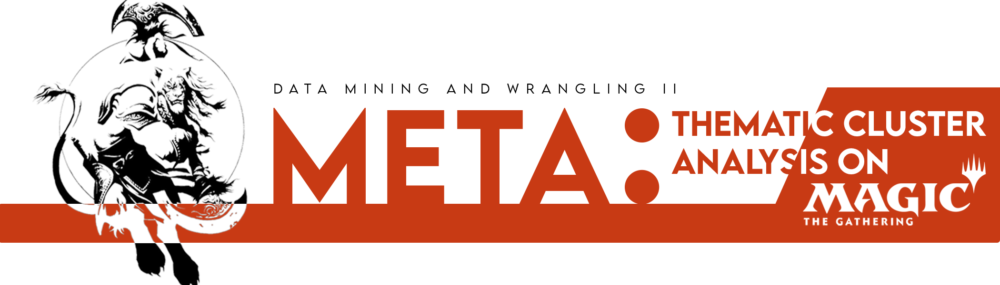

***
<h1 style="color:#c83a14">EXECUTIVE SUMMARY</h1>

***

The Magic: The Gathering (MTG) game has a vast and complex world, with thousands of unique cards and multiple gameplay mechanics. With such a variety, it can be challenging to determine which cards offer the most profitable market opportunities. Our team has utilized numerical, categorical, and text data then performed **cluster analysis** to group cards based on their **themes and features** to gain a deeper understanding of the clusters' most prevalent characteristics. This information enabled us to make strategic recommendations regarding product development and release, marketing, and pricing to drive revenue and growth for MTG.

The objective of this project is to use clustering to identify the most profitable market opportunities for MTG and provide insights to support the company's growth potential. Our team explored K-means, Agglomerative, and OPTICS clustering methodologies to answer the question, ***"What cards present market opportunities that can be capitalized in Magic: The Gathering?"***

After extensive analysis, the team used **Complete Agglomerative Clustering** and classified the cards into five different clusters: `Support`, `Fodders`, `Overpowered`, `Bombers`, and `Normal Effect`. By combining the clustering results with rarity and price data, the team identified market opportunities and recommended strategies to increase revenue and financial growth, such as addressing **under-priced clusters, untapped or under-served clusters, and optimize revenues and earnings from high-profitability cards and clusters** through product development, sales, and marketing initiatives 

***
<h1 style="color:#c83a14">PROBLEM STATEMENT</h1>

***

___What cards present market opportunities that can be capitalized in Magic: The Gathering?___



***
<h1 style="color:#c83a14">MOTIVATION</h1>

***

The world of Magic: The Gathering (MTG) is vast and complex, with thousands of unique cards and numerous gameplay mechanics. With so much variety, it can be difficult to identify which cards present the most profitable market opportunities. This is where the power of cluster analysis comes into play. By grouping cards based on their themes and relevant features, the team can gain deeper understanding of the preferences and needs of the MTG player base. With this information, the team can make appropriate recommendations about product development and release, marketing, and pricing that will drive revenue and growth for MTG. 

This project aims to use clustering methods to identify the most profitable market opportunities for Magic: The Gathering and provide valuable insights that will help MTG capitalize on its strengths and growth potential.

***
<h1 style="color:#c83a14">METHODOLOGY</h1>

***

In line with the purpose of this report, the following methodology intends to explore clustering techniques that could help determine the most profitable market prospects for MTG.

The high-level methodology used in this report is described in **Figure 1**:

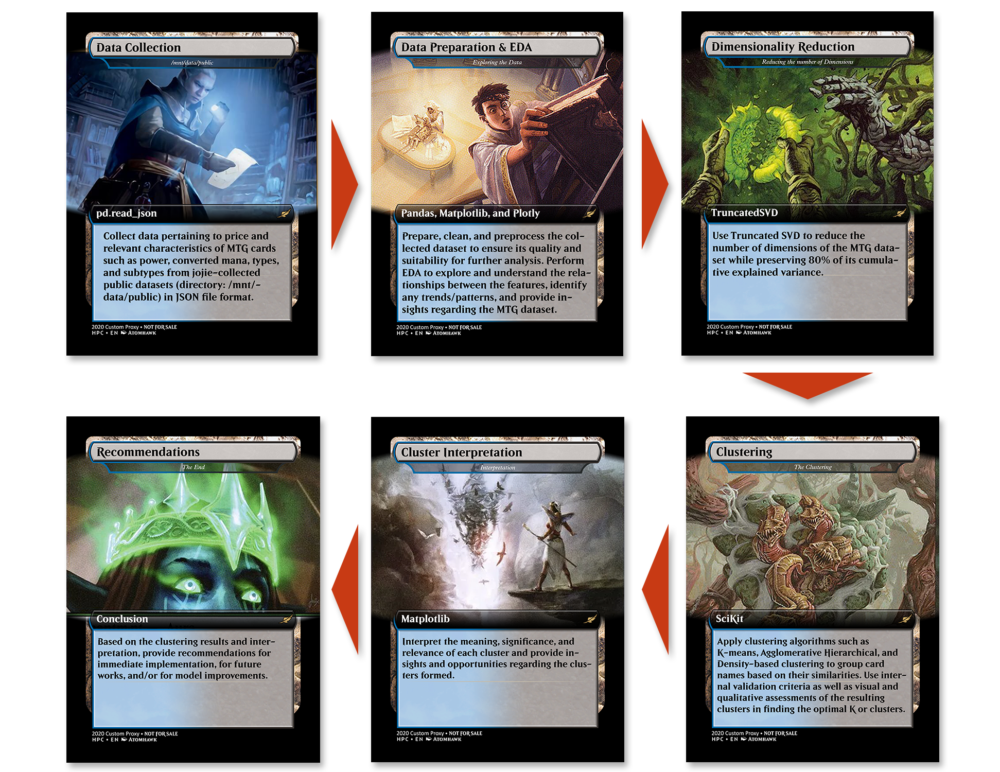

<center><span style="font-size:12px;color:#565656"><b>Figure 1. </b>Methodology</span></center>

<table >
    <tr>
        <th style="text-align: center">No.</th>
        <th style="text-align: center">Step</th>
        <th style="text-align: center">Description</th>
    </tr>
    <tr>
        <td style="text-align: left">1.</td>
        <td style="text-align: left">Data Collection</td>
        <td style="text-align: left">Collect data pertaining to price and relevant characteristics of MTG cards such as power, converted mana, types, and subtypes from jojie-collected public datasets (directory: /mnt/data/public) in JSON file format.</td>
    </tr>
    <tr>
        <td style="text-align: left">2.</td>
        <td style="text-align: left">Data Preparation & Exploratory Data Analysis (EDA)</td>
        <td style="text-align: left">Prepare, clean, and preprocess the collected dataset to ensure its quality and suitability for further analysis. Perform EDA to explore and understand the relationships between the features, identify any trends/patterns, and provide insights regarding the MTG dataset.</td>
    </tr>
    <tr>
        <td style="text-align: left">3.</td>
        <td style="text-align: left">Dimensionality Reduction</td>
        <td style="text-align: left">Use Truncated SVD to reduce the number of dimensions of the MTG dataset while preserving 80% of its cumulative explained variance.</td>
    </tr>
    <tr>
        <td style="text-align: left">4.</td>
        <td style="text-align: left">Clustering</td>
        <td style="text-align: left">Apply clustering algorithms such as K-means, Agglomerative Hierarchical, and Density-based clustering to group card names based on their similarities. Use internal validation criteria as well as visual and qualitative assessments of the resulting clusters in finding the optimal K or clusters. </td>
    </tr>
    <tr>
        <td style="text-align: left">5.</td>
        <td style="text-align: left">Cluster Interpretation</td>
        <td style="text-align: left">Interpret the meaning, significance, and relevance of each cluster and provide insights and opportunities regarding the clusters formed.  </td>
    </tr>
    <tr>
        <td style="text-align: left">6.</td>
        <td style="text-align: left">Recommendations</td>
        <td style="text-align: left">Based on the clustering results and interpretation, provide recommendations for immediate implementation, for future works, and/or for model improvements.  </td>
    </tr>
</table>

<center><span style="font-size:12px;color:#565656"><b>Table 1. </b>Methodology Details</span></center>

More details about the steps mentioned in **Table 1** is presented in the following sections of this report.

***
<h1 style="color:#c83a14">DATA SOURCE AND DESCRIPTION</h1>

***

The MTG dataset used in this report came from JSON files that were scraped and made available to the team via the jojie-collected public datasets (directory: /mnt/data/public/mtgjson) of the Asian Institute of Management (AIM). 

The specific data used for this report includes all the card prices from October 10, 2022 to January 21, 2023 and the relevant card features enumerated in **Table 2**.

After collecting and preprocessing the data, the team was able to gather and use 14,796 card names (rows) and 12 base features (columns) (before transformation). 

The following features were used and considered relevant for this report[[1]](#Features):

<table >
    <tr>
        <th style="text-align: center">Feature Name</th>
        <th style="text-align: center">Feature Description</th>
    </tr>
    <tr>
        <td style="text-align: left">name</td>
        <td style="text-align: left">Name of the MTG card.</td>
    </tr>
    <tr>
        <td style="text-align: left">colors</td>
        <td style="text-align: left">Contains five colors such as white ['W'], blue ['U'], black ['B'], red ['R'], and green ['G']. Each color has specific characteristics, strategies, mechanics, and philosophies that are important for mana cost and color-setting characteristic-defining abilities of each card.</td>
    </tr>
    <tr>
        <td style="text-align: left">colorIdentity</td>
        <td style="text-align: left">Combination of all colors in its mana costs, color-setting characteristic-defining abilities on the card, and any mana symbols in the card's rules text.</td>
    </tr>
    <tr>
        <td style="text-align: left">convertedManaCost</td>
        <td style="text-align: left">The sum of the card's mana cost, regardless of color. Mana is the card's primary resource to play spells.</td>
    </tr>
    <tr>
        <td style="text-align: left">keywords</td>
        <td style="text-align: left">Word or words that represent a piece of rules text describing an ability present on a card.</td>
    </tr>
    <tr>
        <td style="text-align: left">power</td>
        <td style="text-align: left">Amount of damage a card deals in combat to the opposing creature's toughness, the opposing player's life total, or the opposing planeswalker's loyalty.</td>
    </tr>
    <tr>
        <td style="text-align: left">subtypes</td>
        <td style="text-align: left">A characteristic of a card. Every card has a card type and may have one or more subtypes. These are printed on the type line.</td>
    </tr>
    <tr>
        <td style="text-align: left">types</td>
        <td style="text-align: left">Typically have one or more of either the permanent types `Land`, `Creature`, `Artifact`, `Enchantment`, and `Planeswalker`, or of the non-permanent spell types `Instant` and `Sorcery`. A card type dictates many of the general rules regarding when and how a card may be played.</td>
    </tr>
    <tr>
        <td style="text-align: left">mean</td>
        <td style="text-align: left">Mean price of the cards from October 10, 2022 to January 21, 2023.</td>
    </tr>
    <tr>
        <td style="text-align: left">variance</td>
        <td style="text-align: left">Variance in the price of the cards from October 10, 2022 to January 21, 2023.</td>
    </tr>
    <tr>
        <td style="text-align: left">std</td>
        <td style="text-align: left">Standard deviation in the price of the cards from October 10, 2022 to January 21, 2023.</td>
    </tr>
    <tr>
        <td style="text-align: left">rarity</td>
        <td style="text-align: left">Indicates the availability of a card. This affects how often cards will be found when opening card packs with Common being the most frequent and Mythic Rare the least frequent (excluding Special which are usually released during special promotion events in MTG).</td>
    </tr>
</table>

<center><span style="font-size:12px;color:#565656"><b>Table 2. </b>Data Description</span></center>

***
<h1 style="color:#c83a14">DATA EXPLORATION</h1>

***

<h2 style="color:#f1a823">Data Collection</h2>

The team collected data pertaining to price and relevant characteristics of MTG cards such as power, converted mana, types, and subtypes from jojie-collected public datasets (directory: /mnt/data/public) in JSON file format.

In particular, files obtained include `AllPrices.json` and `AllPrintings.json` only. The team performed the data collection with the following considerations:
* In order to properly compare card price growth, the data collection were limited to a single merchant and market type.  To maximize information retention, we retained the merchant-market combination with the most number of cards.
*  A lot of cards are duplicated due to different versions' rarity, in order to preserve the greatest market potential of the card, we retained the prices for the rarest version, excluding `bonus` and `special` versions.

In [4]:
df_print, df_uuid, df_price = collect_MTGdata()

<h2 style="color:#f1a823">Data Preparation and EDA</h2>

In this section, the team performed preparation, cleaning, and preprocessing of the collected dataset to ensure its quality and suitability for further analysis.

<h3 style="color:#565656">Price Data</h3>

<h4 style="color:#0c0f11">Preview</h4>

In [5]:
preview_df(df_price)

Number of Data Points: 14796

Number of Features: 90

Number of Nulls: 1123

,2022-10-22,2022-10-23,2022-10-24,2022-10-25,2022-10-26,2022-10-27,2022-10-28,2022-10-29,2022-10-30,2022-10-31,...,2023-01-13,2023-01-14,2023-01-15,2023-01-16,2023-01-17,2023-01-18,2023-01-19,2023-01-20,2023-01-21,2023-01-22
name,,,,,,,,,,,,,,,,,,,,,
Abandon Hope,0.03,0.03,0.03,0.03,0.03,0.03,0.03,0.03,0.03,0.03,...,0.03,0.03,0.03,0.03,0.03,0.03,0.03,0.03,0.03,0.03
Abandon Reason,0.03,0.03,0.03,0.03,0.03,0.03,0.03,0.03,0.03,0.03,...,0.03,0.03,0.03,0.03,0.03,0.03,0.03,0.03,0.03,0.03
Abandoned Outpost,0.11,0.11,0.11,0.11,0.11,0.11,0.11,0.11,0.11,0.11,...,0.11,0.11,0.11,0.11,0.11,0.11,0.11,0.11,0.11,0.11


<h4 style="color:#0c0f11">Impute missing values</h4>

After investigating the points with null values, the team determined that back-fill and forward-fill should be used to impute the missing prices since those two methods allow for the propagation of time-based information with the assumption that the value in a given time period is similar to the value in the previous period (or if not available, the value of the next day):

In [6]:
df_price.bfill(axis=1, inplace=True)
df_price.ffill(axis=1, inplace=True)
preview_df(df_price, display_df=False)

Number of Data Points: 14796

Number of Features: 90

Number of Nulls: 0

<h4 style="color:#0c0f11">Get the Mean, Variance, and Standard Deviation</h4>

New columns such as `mean`, `variance`, and `std` of the card prices' growth were created for further analysis in the coming sections.

In [7]:
df_growth = create_price_stats(df_price)

,2022-10-22,2022-10-23,2022-10-24,2022-10-25,2022-10-26,2022-10-27,2022-10-28,2022-10-29,2022-10-30,2022-10-31,...,2023-01-16,2023-01-17,2023-01-18,2023-01-19,2023-01-20,2023-01-21,2023-01-22,mean,variance,std
name,,,,,,,,,,,,,,,,,,,,,
Abandon Hope,0.03,0.03,0.03,0.03,0.03,0.03,0.03,0.03,0.03,0.03,...,0.03,0.03,0.03,0.03,0.03,0.03,0.03,0.03,0.00,0.00
Abandon Reason,0.03,0.03,0.03,0.03,0.03,0.03,0.03,0.03,0.03,0.03,...,0.03,0.03,0.03,0.03,0.03,0.03,0.03,0.03,0.00,0.00
Abandoned Outpost,0.11,0.11,0.11,0.11,0.11,0.11,0.11,0.11,0.11,0.11,...,0.11,0.11,0.11,0.11,0.11,0.11,0.11,0.11,0.00,0.01


<h4 style="color:#0c0f11">Plot Data</h4>

Plot price data's risk(`std`)-returns(`mean`).

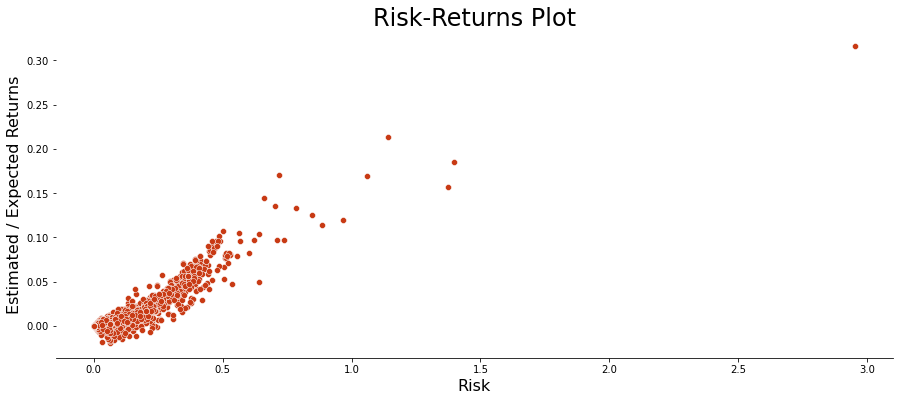

In [8]:
plot_price_risk_returns(df_growth)

<center><span style="font-size:12px;color:#565656"><b>Figure 2. </b>Risk-return plot of each individual card</span></center>

As seen in **Figure 2**, most cards have minimal return rates and risk percentages, however, there are few cards with great risk-return ratios.

<h3 style="color:#565656">Prints Data</h3>

#### Preview

In [9]:
preview_df(df_print)

Number of Data Points: 14796

Number of Features: 9

Number of Nulls: 15476

,colorIdentity,colors,convertedManaCost,edhrecRank,keywords,power,subtypes,text,types
name,,,,,,,,,
Abandon Hope,['B'],['B'],2.00,"16,321.00",NaN,NaN,[],"As an additional cost to cast this spell, discard X cards.\nLook at target opponent's hand and choose X cards from it. That player discards those cards.",['Sorcery']
Abandon Reason,['R'],['R'],3.00,"9,765.00",['Madness'],NaN,[],"Up to two target creatures each get +1/+0 and gain first strike until end of turn.\nMadness {1}{R} (If you discard this card, discard it into exile. When you do, cast it for its madness cost or put it into your graveyard.)",['Instant']
Abandoned Outpost,['W'],[],0.00,"15,637.00",NaN,NaN,[],"Abandoned Outpost enters the battlefield tapped.\n{T}: Add {W}.\n{T}, Sacrifice Abandoned Outpost: Add one mana of any color.",['Land']


#### Impute missing values and transform df_print

After investigating the points with null values in df_print, the team performed the following pre-processing steps:

1. Converted null values in `powers` to 0.
2. Converted list of strings values of categorical columns to list.
3. Used `pd.get_dummies()` to transform categorical columns into one-hot encoded variables.
4. Used `StandardScaler()` method to normalize the `convertedManaCost` and `power` columns, while the remaining columns, which were all one-hot encoded, were excluded from scaling.

In [10]:
df_print, df_eda, df_cat = df_print_preprocessing(df_print)
preview_df(df_print, display_df=False)

Number of Data Points: 14796

Number of Features: 9

Number of Nulls: 0

In [11]:
preview_df(df_eda)

Number of Data Points: 14796

Number of Features: 553

Number of Nulls: 0

,convertedManaCost,power,colorIdentity_B,colorIdentity_G,colorIdentity_R,colorIdentity_U,colorIdentity_W,colors_B,colors_G,colors_R,...,types_Artifact,types_Creature,types_Enchantment,types_Instant,types_Land,types_Plane,types_Planeswalker,types_Sorcery,types_Tribal,types_Vanguard
name,,,,,,,,,,,,,,,,,,,,,
Abandon Hope,-0.75,-0.78,1.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,...,0,0,0,0,0,0,0,1,0,0
Abandon Reason,-0.18,-0.78,0.00,0.00,1.00,0.00,0.00,0.00,0.00,1.00,...,0,0,0,1,0,0,0,0,0,0
Abandoned Outpost,-1.89,-0.78,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,...,0,0,0,0,1,0,0,0,0,0


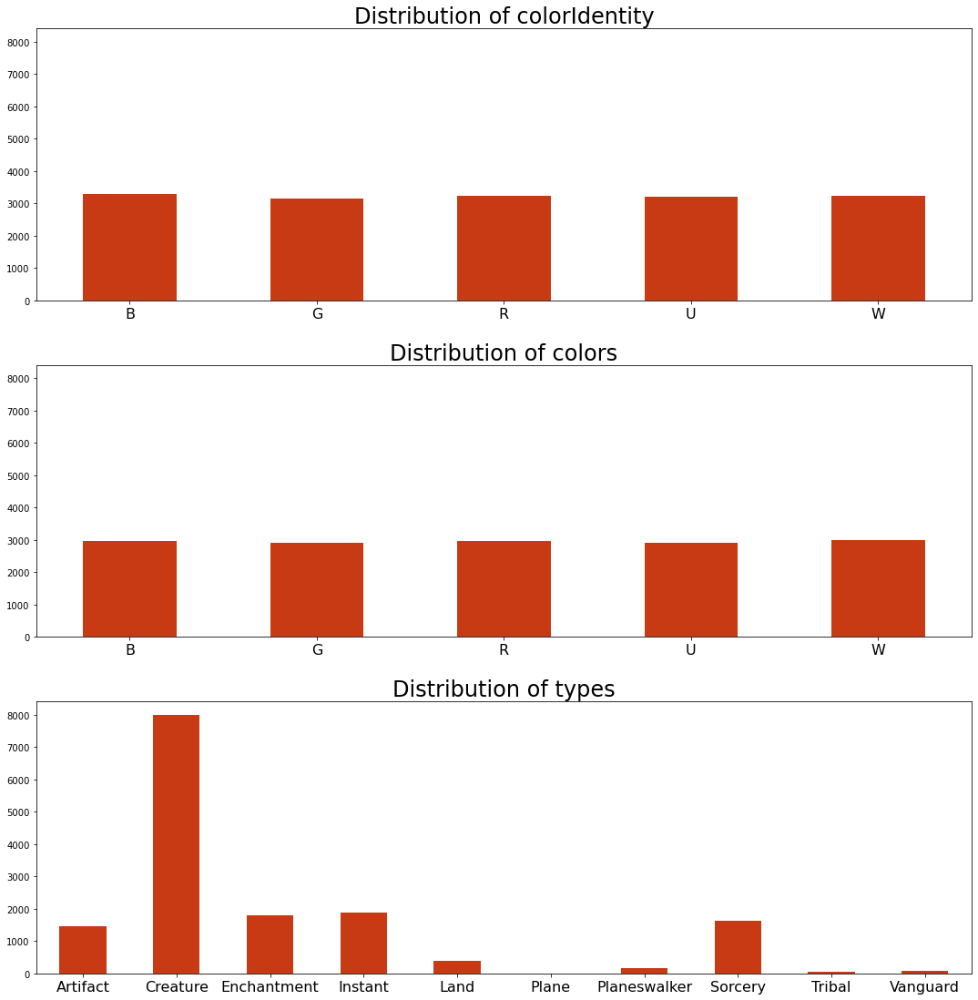

In [12]:
plot_dist_catcols()

<center><span style="font-size:12px;color:#565656"><b>Figure 3. </b>Distribution of categorical columns</span></center>

As evident from the plots in **Figure 2**, `colorIdentity` and `colors` features showed somewhat balanced distribution of data. On the other hand, the distribution of `types` showed high quantity of `Creatures`, and low quantities for `Plane`, `Tribal`, `Vanguard`, and `Planeswalker`.

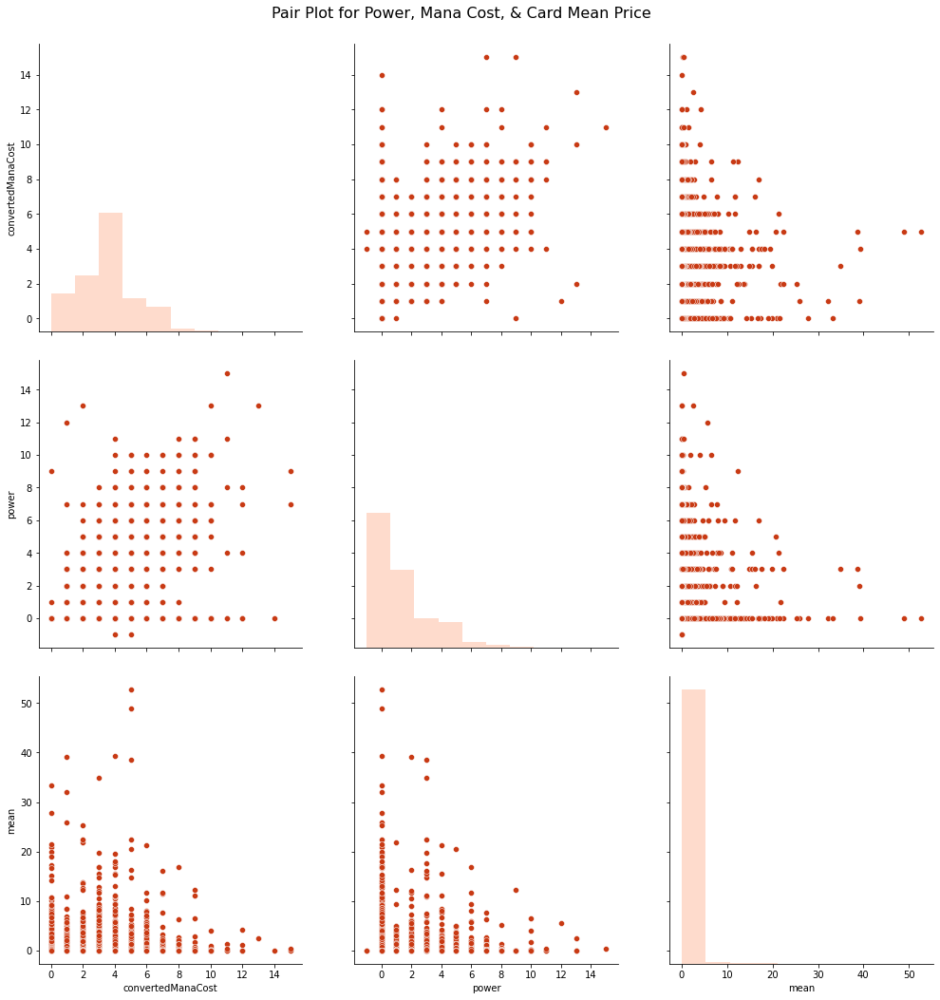

In [13]:
scatter_matrix()

<center><span style="font-size:12px;color:#565656"><b>Figure 4. </b>CMC and Power vs. Mean Price</span></center>

Based on **Figure 4**, the team identified the following relationships between `mean` price and `power` and 
`mean` price and `convertedManaCost` (CMC).

* the maximum `mean` price of `power` is decreasing as `power` increases, and 
* the same is slightly true for CMC, except that there were some outliers at around CMC $\in$ [3, 5].

However, `power` and CMC are not the only features that determine the price of a card. So before drawing any conclusions about the above plots, the team should proceed exploring other features.

Finally, a new data frame, named `df_pp`, was also created based on the merged data of `df_print` and `df_price` for reference in later analyses. 

In [14]:
df_pp = pd.merge(df_print, df_price[['mean', 'variance', 'std']],
                 left_index=True, right_index=True)
preview_df(df_pp)

Number of Data Points: 14796

Number of Features: 12

Number of Nulls: 0

,colorIdentity,colors,convertedManaCost,edhrecRank,keywords,power,subtypes,text,types,mean,variance,std
name,,,,,,,,,,,,
Abandon Hope,[B],[B],2.00,"16,321.00",[],0,[],"As an additional cost to cast this spell, discard X cards.\nLook at target opponent's hand and choose X cards from it. That player discards those cards.",[Sorcery],0.03,0.00,0.00
Abandon Reason,[R],[R],3.00,"9,765.00",[Madness],0,[],"Up to two target creatures each get +1/+0 and gain first strike until end of turn.\nMadness {1}{R} (If you discard this card, discard it into exile. When you do, cast it for its madness cost or put it into your graveyard.)",[Instant],0.03,0.00,0.00
Abandoned Outpost,[W],[],0.00,"15,637.00",[],0,[],"Abandoned Outpost enters the battlefield tapped.\n{T}: Add {W}.\n{T}, Sacrifice Abandoned Outpost: Add one mana of any color.",[Land],0.11,0.00,0.01


***
<h1 style="color:#c83a14">DIMENSIONALITY REDUCTION</h1>

***

After preprocessing and transforming the MTG dataset using `pd.get_dummies()` encoding, the number of dimensions increased to 553. As such, the team decided to perform dimensionality reduction. To improve the interpretation of the data and decrease the processing time, the team sought to reduce the number of features while minimizing information loss. To accomplish this, the team used Truncated Singular Value Decomposition (SVD), which is effective for sparse matrices, which is the characteristic of the MTG data.

To do this, the team performed the following:
* Truncated the design matrix into a matrix that contains cumulative variance explained of 80% using the simplified manual truncated_svd code below:

```Python
def truncated_svd(X):
    """Return the Q, Sigma, and P SVD of the design matrix X as well as the
    normalized sum of squared distance from the origin.
    """
    q, s, p = np.linalg.svd(X)
    nssd = s**2 / np.sum(s**2)
    s = np.diag(s)
    p = p.T
    
    return q, s, p, nssd
```

* Then project or actually truncate the original matrix to the updated design matrix based on the above results using the project_svd code below:


```Python
def project_svd(q, s, k):
    """Returns design matrix projected on to the first k singular vectors.
    """
    return q[:, :k]@s[:k, :k]
````


#### Check for sparsity

In [15]:
sparsity_check()

% of non-zero data over total: 1.20%. Hence, the data is sparse.


#### Use truncated SVD get q, s, p, and nssd

In [16]:
try:
    q_nt = joblib.load('q_nt.pkl')
    s_nt = joblib.load('s_nt.pkl')
    p_nt = joblib.load('p_nt.pkl')
    nssd_nt = joblib.load('nssd_nt.pkl')
    print('Saved Files Loaded!')
except:
    q_nt, s_nt, p_nt, nssd_nt = truncated_svd(df_eda.to_numpy(), suffix='nt')

Saved Files Loaded!


#### Plot cumulative variance explained and SVs to retain

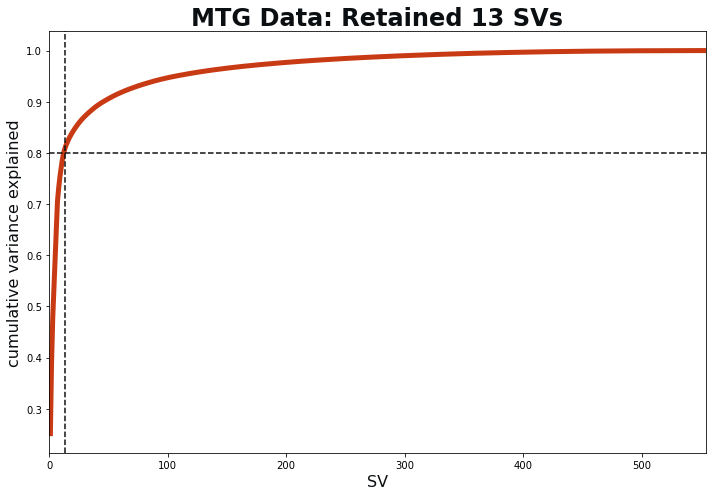

In [17]:
k_nt = plot_sv(nssd_nt, 0.8, title='MTG Data')

<center><span style="font-size:12px;color:#565656"><b>Figure 5. </b>Truncated SVD</span></center>

Projected or truncated the original matrix to the updated design matrix with 13 SVs based on **Figure 5** using the `project_svd` code mentioned earlier.

In [18]:
x_truncated_nt = project_svd(q_nt, s_nt, k_nt)

Converted the result to dataframe, renamed columns, and displayed head:

In [19]:
df_truncated_nt = pd.DataFrame(x_truncated_nt, columns=[f'sv{i}' for i in range(
    1, x_truncated_nt.shape[1]+1)], index=df_print.index)
display(df_truncated_nt.head(3))

,sv1,sv2,sv3,sv4,sv5,sv6,sv7,sv8,sv9,sv10,sv11,sv12,sv13
name,,,,,,,,,,,,,
Abandon Hope,-0.86,0.86,0.42,0.91,-0.61,-0.51,0.56,-0.20,-0.15,0.55,-0.50,0.20,-0.11
Abandon Reason,-0.55,0.67,0.62,0.59,0.91,-0.19,-0.74,-0.18,-0.62,-0.41,0.32,-0.06,-0.10
Abandoned Outpost,-1.63,1.18,-0.70,-0.40,-0.06,-0.28,-0.01,0.03,-0.17,0.09,-0.30,0.04,0.06


The team selected the corresponding number of singular values (SVs) based on the explained variance that would retain most of the information from the data. The goal was to retain 80% of the information contained in the MTG dataset, as shown by the 80% cumulative explained variance. **Figure 4** demonstrated that by using TruncatedSVD, the team was successful in reducing the number of dimensions from 553 to 13 singular values.

***
<h1 style="color:#c83a14">RESULTS AND DISCUSSIONS</h1>

***

<h2 style="color:#f1a823">Clustering</h2>

In this report, the team explored three methods in clustering the MTG dataset:

1. K-Means Clustering (K-Means)
2. Agglomerative Hierarchical Clustering (AHC)
3. Density-based Clustering (DBC)

To maintain focus and simplify the presentation, only the final selected clustering method is displayed in the subsequent sections.

For a comprehensive understanding of the process of selecting the best method, please refer to the notes below that document the team's iterative journey of exploring different combinations of outcomes for these methods:

1. **K-Means**: 
    Best outcome using this method provided the following results:
        Number of clusters: 3
        SSD: 76254.4014
        Silhouette score: 0.1362
        Davies Bouldin score: 2.1094
        Calinski Harabasz score: 2760.9343
        
        Aside from the low internal validation criteria scores, qualitative assessment of the 
        resulting cluster members did not provide a consistent grouping of 
        the points. Hence, this method was dropped.

2. **DBC**:
    Best outcome using this method provided the following results:
        Number of clusters: 4
        Number of noise points: 4433
        Number of points: 14796
        Silhouette score: 0.050131164581188284
    
For both methods (K-Means and DBC), aside from the low internal validation criteria scores, qualitative assessment of the resulting cluster members did not provide a consistent grouping of the points. Hence, these methods were dropped.

<h3 style="color:#565656">Agglomerative Clustering</h3>

In applying `Agglomerative Clustering`, the team performed the following:

1. Visualized and checked the default dendrogram results of `single`, `complete`, `average`, and `ward`'s method and then determined which methods will be used moving forward by selecting the method with the most balanced clustering of the MTG dataset.
2. Based on the best method selected in step 1, performed final clustering and plotted the dendrogram and scatterplot of the resulting clusters.
3. Saved and assigned the resulting clusters to a new dataframe that is a copy of df_pp containing both price and relevant features.
4. Assessed the main traits or characteristics of the members of each cluster and labeled it accordingly.
5. Plotted the most prevalent traits of each cluster to visualize the defining characteristics that aided in assigning the labels appropriate for the general composition of the members of each cluster.

File Loaded


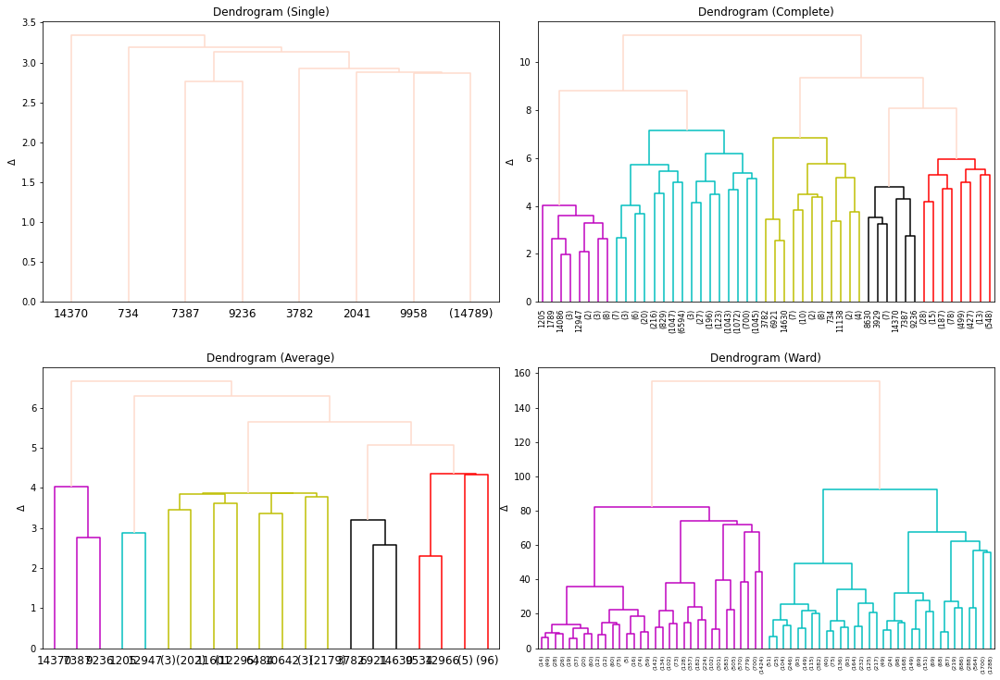

In [20]:
Zs = default_dendrogram_all()

<center><span style="font-size:12px;color:#565656"><b>Figure 6. </b>Comparison of Agglomerative Clustering Methods</span></center>

FINAL CLUSTERING
-----------------
Number of clusters: 5
Calinski-Harabasz score: 820.0700801752804
Davies-Bouldin score: 1.1690187748884182
Silhouette score: 0.2201472271285773


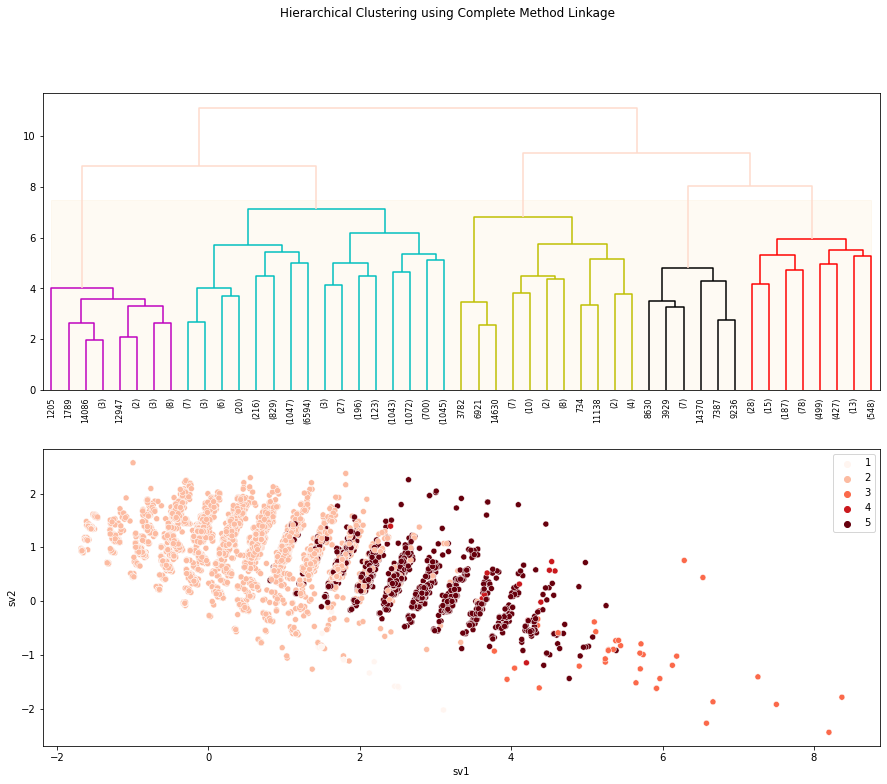

In [21]:
y_k = selected_agglo_method()

<center><span style="font-size:12px;color:#565656"><b>Figure 7. </b>Final Clustering for MTG Cards</span></center>

Saved and assigned the resulting agglomerative classes to each point in df_clusters (a copy of df_pp where relevant columns were merged).

In [22]:
df_clusters = df_pp.copy()
df_clusters['agglo_class'] = y_k
df_clusters.sample()

,colorIdentity,colors,convertedManaCost,edhrecRank,keywords,power,subtypes,text,types,mean,variance,std,agglo_class
name,,,,,,,,,,,,,
Bloodcrazed Neonate,[R],[R],2.00,"15,681.00",[],2,[Vampire],"Bloodcrazed Neonate attacks each combat if able.\nWhenever Bloodcrazed Neonate deals combat damage to a player, put a +1/+1 counter on it.",[Creature],0.02,0.00,0.00,2


The team assessed the main topics or characteristics of each cluster and label it as follows:

In [23]:
labels_dict ={1:'Support',
              2:'Fodders',
              3:'Overpowered',
              4:'Bombers',
              5:'Normal Effect'}

df_clusters['cluster_labels'] = df_clusters['agglo_class'].map(labels_dict)

Plotted the prevalent traits or features of each cluster to visualize the defining characterestics that aid in assigning the labels appropriate for the general composition of the members of each cluster.

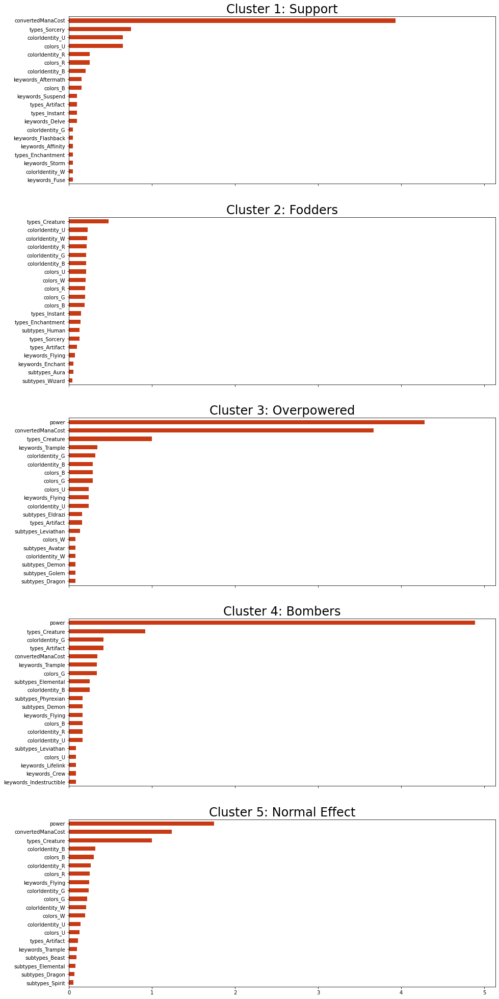

In [24]:
plot_top_traits()

<center><span style="font-size:12px;color:#565656"><b>Figure 8. </b>Cluster Labels and Traits</span></center>

<h2 style="color:#f1a823">Pricing Risk Analysis</h2>

In [25]:
fig = plot_clusters_3d()
fig.show(renderer='vscode')
fig.show(renderer='notebook')

<center><span style="font-size:12px;color:#565656"><b>Figure 9. </b>3D Representation of SV1 and SV2 plotted against the cards' mean prices</span></center>

As seen in **Figure 9**, most of the cards with highest `mean` card prices are `Fodders`. It is also notable that `Bombers` have very low `mean` prices.

Summarized the mean and variance (std) of the MTG Dataset. The team used Modern Portfolio Theory in assessing the estimated risk-returns status of each cluster. 

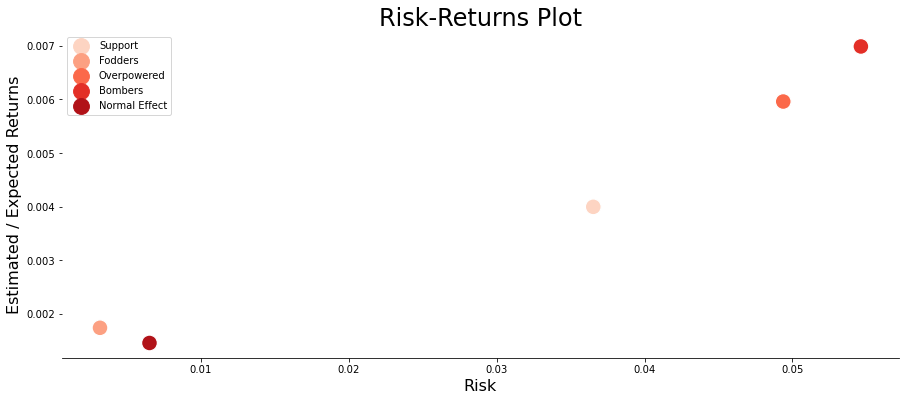

In [26]:
MPT_risk_returns()

<center><span style="font-size:12px;color:#565656"><b>Figure 9. </b>MPT Risk and Returns of each cluster</span></center>

As observed above in **Figure 9**, `Bombers` have the highest return rates but also the riskiest investment. `Normal Effect` cards showed lower levels of returns for higher levels of risk.

<h2 style="color:#f1a823">Clustering and Rarity Analysis</h2>

The team added rarity to the df_cluster to further analyze the effectivity of the clustering results and identify opportunities for growth:

In [27]:
df_rarity = pd.merge(df_clusters, df_uuid[['rarity']], how='left', left_index=True, right_index=True)
df_rarity = df_rarity[~df_rarity.index.duplicated(keep='first')]
preview_df(df_rarity, display_df=False)

Number of Data Points: 14796

Number of Features: 15

Number of Nulls: 0

In [28]:
plot_rarity_price()

<center><span style="font-size:12px;color:#565656"><b>Figure 10. </b>Cluster labels plotted against rarity and card mean prices</span></center>

In [29]:
pivot_price_cluster_rarity()

cluster_labels,Bombers,Fodders,Normal Effect,Overpowered,Support
rarity,,,,,
special,0.00,0.06,0.00,0.00,0.00
mythic,0.00,1.86,1.28,1.49,0.40
rare,0.53,0.52,0.19,0.89,0.04
uncommon,0.03,0.10,0.05,0.04,0.03
common,0.00,0.08,0.06,0.00,0.00


<center><span style="font-size:12px;color:#565656"><b>Table 3. </b>Mean prices of clusters grouped by rarity</span></center>

In [30]:
rarity_dist_by_cluster()

cluster_labels,Bombers,Fodders,Normal Effect,Overpowered,Support
rarity,,,,,
special,0,5,0,0,0
mythic,0,444,209,10,6
rare,11,3397,656,22,12
uncommon,1,4127,495,6,2
common,0,4958,435,0,0


<center><span style="font-size:12px;color:#565656"><b>Table 4. </b>Rarity Distribution of each Cluster</span></center>

In [31]:
display(df_clusters[['mean', 'cluster_labels']].sort_values('mean', ascending=False).head(10))

,mean,cluster_labels
name,,
Aether Gale,52.76,Fodders
Force of Will,48.83,Fodders
"Karn, the Great Creator",39.34,Fodders
"Ragavan, Nimble Pilferer",39.03,Fodders
Fury,38.60,Normal Effect
Endurance,34.84,Fodders
Gaea's Cradle,33.29,Fodders
Flusterstorm,32.11,Fodders
Mox Diamond,27.78,Fodders


<center><span style="font-size:12px;color:#565656"><b>Table 5. </b>Top Ten Most Valuable Cards</span></center>

<h3 style="color:#565656">Summary of Clustering-Rarity Insights</h3>

Based on the 3D plot in **Figure 10**, pivot tables of the mean prices of the clusters grouped by rarity and rarity distribution of each cluster in **Table 3** and **Table 4**, respectively, the team have noted the following items:

1. 	Based on **mean prices** (**Figure 10** and **Table 3**):
    - The data suggests that `mythic` rarity category have the highest average prices, ranging from \$0.40 to \$1.86. 
	- `Fodders` cluster in the `mythic` rarity category has the highest average price of \$1.86.
    - `Bombers` and `Overpowered` cards in the `rare` rarity category have high average prices of \$0.53 and \$0.89 respectively.
    - `Normal Effect` and `Support` cards in the `rare` rarity category have relatively lower average prices of \$0.19 and \$0.04, respectively.
    - Surprisingly, `uncommon` rarity category has the lowest average price, with all clusters having prices ranging from \$0.03 to \$0.05 (excluding `Fodders`). 
    - As expected, `common` rarity category also has low average prices, with values ranging from \$0.06 to \$0.08.
    - There were five `special` rarity items released for `Fodders` cluster only with average price of \$0.06.
    - In summary, the data confirms that `mythic` rarity cards are generally more expensive than the other rarities, and the prices of cards vary greatly among the different clusters. The most expensive cards tend to be from `Fodders`, `Overpowered`, and `Normal Effect` clusters, while the least expensive cards are mostly from the `uncommon` rarity category.

2. Based on total count of cards (**Figure 10** and **Table 4**):
    - The majority of the cards fall under the "common" rarity category, with 4,958 total cards.
    - The `Bombers`, `Support`, and `Overpowered` clusters have relatively low total counts, with 12, 20, and 38 cards, respectively.
    - The `Fodders` cluster has the highest count of cards among all the rarity categories. This is mainly due to `Fodders` high representation in terms of total card count.

<h2 style="color:#f1a823">Interpretation of Clustering Results</h2>

In determining and assigning the cluster labels appropriate for each class obtained using Complete Agglomerative Clustering Method, the team considered the following steps:

1. Identify the most prominent and dominant features that represent each cluster.
2. Compare such most prominent features between different clusters and identify differentiating factors that provides how well the clusters are separated from each other.
3. Evaluate the significance of each characteristics by determining the top predictors of each cluster.
4. Through further visualizations, identify trends and patterns in the members of each cluster.
5. Validate the results by comparing it to other available data such as price and rarity which have the greatest impact in identifying the implicit demand for a card.

Based on the above steps, the team was able to finalize the following clustering results:

* __Cluster 1__ is labeled as __Support__ cards which are characterized by mostly Sorcery type cards with **no** power but **high** converted mana cost. 
* __Cluster 2__ is labeled as __Fodders__ cards are inexpensive or low-value cards that are used to fuel certain abilities, such as sacrificing creatures to generate mana, or to trigger certain effects, such as creating token creatures.
* __Cluster 3__ is labeled as __Overpowered__ cards which are characterized by creature and artifact type cards with high converted mana cost and power. 
* __Cluster 4__ is labeled as __Bombers__ are cards that are very impacful and powerful that can change the tide of the game. This cards are characterized as having extemely high power.
* __Cluster 5__ is labeled as __Normal Effect__ cards are those that are not special or unique in any way. These cards are typically simple spells, creatures, lands, or artifacts that do not have any additional abilities, keywords, or special rules attached to them.






***
<h1 style="color:#c83a14">RECOMMENDATIONS</h1>

***

<h2 style="color:#f1a823">For current/immediate implementation</h2>


This project aims to use clustering methods to identify the most profitable market opportunities for Magic: The Gathering and provide valuable insights that will help MTG capitalize on its strengths and growth potential.

Considering the distribution of card rarities, clusters, and computed mean prices for each cluster, MTG can use these information to make decisions about the creation and distribution of future cards, as well as adjust pricing and marketing strategies. Some strategies that MTG can implement are as follows:

1. For **underpriced clusters** such as clusters linked with `Uncommon` rarity cards, MTG can do any or all of the following:
    - Reduce the supply of underpriced cards by not reprinting them frequently. This will increase those card's price over time.
    - Add the underpriced cards in sets that are about to be rotated out of Standard or release limited edition versions of those cards, to make those cards more rare and eventually increasing their price.
    - Collaborate with popular gaming and pop-culture brands, and offer exclusive promotional cards that feature these underpriced cards. This will increase the demand for these cards, and in turn, increase their price.
    - Invest in marketing and advertising campaigns, rebrand or re-imagine the underpriced cards to make them appealing to the new generation of players, and this will increase the demand and price of such cards.
    - Improve the playability of underpriced cards, making them more appealing to players, and increase their demand and price.
    
    
2. For **untapped or under-served market** (low competition, high demand or low card count, high average price clusters) such as `Mythic` rarity cards in `Overpowered` Cluster, MTG could perform the following:
    - Conduct market research, customer surveys, product development plan, etc. using insights that will be obtained from analyzing sales data for similar cards within the same cluster. In developing new cards, MTG should ensure that the new card has similar characteristics such as power, mana, color, and type, among others to serve the market for such cluster and rarity combination.


3. For **individual cards and clusters that showed extremely high average prices** such as the top 10 cards based on average price presented in **Table 5**, MTG can implement any or all of the following strategies:
    - Issue limited edition reprints or limited time offers or deals to create scarcity, increase urgency, and drive up demand and price.
    - Improve or upgrade the cards to make them even more desirable to players and collectors.
    - Partner with third-party companies to produce merchandise based on the high-priced cards which can include t-shirts, posters, and other collectible items.
    - Cross-promote the high-priced cards with other popular games and products to reach a wider audience.
    - Create a loyalty program for players and collectors who purchase the high-priced cards, incentivizing repeat purchases and building customer loyalty.
    - Increase marketing efforts, promote, and leverage influencer marketing to promote the high-priced cards, reaching a wider audience and building interest and excitement.

<h2 style="color:#f1a823">Data Assumptions and Limitations</h2>


Although the team is confident about the findings in this report, it is important to address the team's assumptions and this report's limitations.

For this report, the team opted to use only few relevant files and card features from the jojie public database. Despite the collection being generally diverse and large, the files considered in this report contains the best representation of the base and differentiable characteristics of the MTG cards.

During the assignment of cluster labels, in cases where there is no discernible theme, the team manually used the top-ranking features (proxy for top predictor) as a basis for labeling the cluster.

<h2 style="color:#f1a823">For Future Works and Model Improvements</h2>

* Increase the scope of the data by using the other JSON files available in the database as well as increase or balance the representation of each card type for better clustering analysis results.

* Utilize other features such as text, card condition, and other features to obtain better clustering results that could somehow compactness and separation of clusters, provided that such features that will be added should not introduce multicollinearity and other issues.

* Explore other and more advanced clustering techniques aside from k-means, agglomerative, and density-based methods.

* Incorporate more time-series data and analysis.

* Consider including sentiment analysis on user reviews or forums to understand and incorporate its effects in the popularity, rarity, and demand for specific cards or card types.

***
<h1 style="color:#c83a14">CONCLUSION</h1>

***

In creating this report, the team aimed to identify market opportunities that can be capitalized in Magic: The Gathering by using various clustering methods and other relevant analyses.

After exploring the three clustering methods such as K-means, Agglomerative, and OPTICS, the team was able to arrive at the following conclusion:
   
The cards were classified into five different clusters namely: `Support`, `Fodders`, `Overpowered`, `Bombers`, and `Normal Effect`.

Moreover, by combining the clustering results with the rarity and price data, the team was able to identify market opportunities in terms of product development, sales, and marketing strategies that can be implemented by MTG to increase revenue and financial growth. Such recommendations include accommodating the demands and pricing adjustments needed to address under-priced clusters, untapped or under-served clusters, and high-profitability cards and clusters.

***
<h1 style="color:#c83a14">REFERENCE</h1>

***

<a name='Features'></a>[1] MTG Wiki. (n.d.). *Magic: The Gathering*. Retrieved February 8, 2023, from  https://mtg.fandom.com/wiki/Magic:_The_Gathering.

**END**